In [4]:
!pip3 install numpy

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 5.3 MB 1.8 MB/s eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


In [7]:
import numpy as np

def loopy_belief_propagation(graph, potential, max_iters = 10, tol = 1e-8):

    messages = {}
    for node in graph:
        for neighbour in graph[node]:
            messages[(node, neighbour)] = np.ones(potential[node].shape) / potential[node].shape[0]


    for _ in range(max_iters):
        prev_message = messages.copy()

        for node in graph:
            for neighbour in graph[node]:
                messages_consider = [messages[(n, node)] for n in graph[node] if n!=neighbour]

                if messages_consider:
                    message_neighbour = potential[node] * np.prod(messages_consider, axis=0)
                else:
                    message_neighbour = potential[node]

                messages[(node, neighbour)] = message_neighbour / np.sum(message_neighbour)

        if np.linalg.norm(np.array(list(messages.values())) - np.array(list(prev_message.values()))) < tol:
            break

        beliefs = {}
        for node in graph:
            incoming = [messages[(n, node)] for n in graph[node]]
            if incoming:
                beliefs[node] = potential[node] * np.prod(incoming, axis=0)
            else:
                beliefs[node] = potential[node]
            beliefs[node] /= np.sum(beliefs[node])

    return beliefs

graph = {'A': ['B', 'C'], 'B': ['A', 'D'], 'C': ['A', 'D'], 'D': ['B', 'C']}
potential = {'A': np.array([0.1, 0.9]), 'B': np.array([0.5, 0.5]), 'C': np.array([0.7, 0.3]), 'D': np.array([0.8, 0.2]), ('A', 'B'): np.array([[0.8, 0.2], [0.7, 0.3]]), ('B', 'C'): np.array([[0.1, 0.9], [0.5, 0.5]]), ('C', 'D'): np.array([[0.8, 0.2], [0.7, 0.3]]), ('D', 'C'): np.array([[0.1, 0.9], [0.5, 0.5]])}
print(loopy_belief_propagation(graph, potential))

{'A': array([0.13781613, 0.86218387]), 'B': array([0.26451778, 0.73548222]), 'C': array([0.26451778, 0.73548222]), 'D': array([0.26451778, 0.73548222])}


In [9]:
!pip3 install dgl torch pandas networks


Defaulting to user installation because normal site-packages is not writeable
  Using cached dgl-2.2.0-cp39-cp39-macosx_11_0_arm64.whl (7.4 MB)
  Using cached torch-2.6.0-cp39-none-macosx_11_0_arm64.whl (66.5 MB)
  Using cached pandas-2.2.3-cp39-cp39-macosx_11_0_arm64.whl (11.3 MB)
  Using cached networks-0.3.7-py3-none-any.whl
  Using cached networkx-3.2.1-py3-none-any.whl (1.6 MB)
  Using cached torchdata-0.10.1-py3-none-any.whl (57 kB)
  Using cached scipy-1.13.1-cp39-cp39-macosx_12_0_arm64.whl (30.3 MB)
  Using cached sympy-1.13.1-py3-none-any.whl (6.2 MB)
  Using cached fsspec-2024.12.0-py3-none-any.whl (183 kB)
  Using cached jinja2-3.1.5-py3-none-any.whl (134 kB)
  Using cached filelock-3.17.0-py3-none-any.whl (16 kB)
  Using cached tzdata-2025.1-py2.py3-none-any.whl (346 kB)
  Using cached pytz-2025.1-py2.py3-none-any.whl (507 kB)
  Using cached jsonpickle-4.0.1-py3-none-any.whl (46 kB)
  Using cached matplotlib-3.9.4-cp39-cp39-macosx_11_0_arm64.whl (7.8 MB)
  Using cached font

In [2]:
!pip3 install dgl torch==2.6.0 --force-reinstall -f https://data.dgl.ai/wheels/cu121/repo.html

Defaulting to user installation because normal site-packages is not writeable
Looking in links: https://data.dgl.ai/wheels/cu121/repo.html
  Using cached dgl-2.2.0-cp39-cp39-macosx_11_0_arm64.whl (7.4 MB)
  Using cached torch-2.6.0-cp39-none-macosx_11_0_arm64.whl (66.5 MB)
  Using cached filelock-3.17.0-py3-none-any.whl (16 kB)
  Using cached typing_extensions-4.12.2-py3-none-any.whl (37 kB)
  Using cached jinja2-3.1.5-py3-none-any.whl (134 kB)
  Using cached networkx-3.2.1-py3-none-any.whl (1.6 MB)
  Using cached fsspec-2024.12.0-py3-none-any.whl (183 kB)
  Using cached sympy-1.13.1-py3-none-any.whl (6.2 MB)
  Using cached mpmath-1.3.0-py3-none-any.whl (536 kB)
  Using cached scipy-1.13.1-cp39-cp39-macosx_12_0_arm64.whl (30.3 MB)
  Using cached torchdata-0.10.1-py3-none-any.whl (57 kB)
  Using cached pandas-2.2.3-cp39-cp39-macosx_11_0_arm64.whl (11.3 MB)
  Using cached psutil-6.1.1-cp36-abi3-macosx_11_0_arm64.whl (248 kB)
  Using cached numpy-2.0.2-cp39-cp39-macosx_14_0_arm64.whl (5.3

In [1]:
import pandas as pd
import numpy as np
import torch
import networkx as nx
import matplotlib.pyplot as plt


In [2]:
# Download STRING PPI dataset (subsampled)
url = "https://stringdb-static.org/download/protein.links.v11.5/9606.protein.links.v11.5.txt.gz"
ppi_data = pd.read_csv(url, sep=" ", compression="gzip")

# Filter high-confidence interactions (score > 700)
ppi_data = ppi_data[ppi_data["combined_score"] > 700]

ppi_data

,protein1,protein2,combined_score
5,9606.ENSP00000000233,9606.ENSP00000324287,767
96,9606.ENSP00000000233,9606.ENSP00000387286,730
132,9606.ENSP00000000233,9606.ENSP00000262812,745
144,9606.ENSP00000000233,9606.ENSP00000158762,765
145,9606.ENSP00000000233,9606.ENSP00000449270,757
...,...,...,...
11938211,9606.ENSP00000485663,9606.ENSP00000248342,999
11938226,9606.ENSP00000485663,9606.ENSP00000416255,908
11938234,9606.ENSP00000485663,9606.ENSP00000220849,999
11938251,9606.ENSP00000485663,9606.ENSP00000346088,738


In [3]:
G = nx.from_pandas_edgelist(ppi_data, 'protein1', 'protein2')

print(f"Graph has {G.number_of_nodes()} nodes and {G.number_of_edges()} edges")
print(f"Graph is directed: {nx.is_directed(G)}")


Graph has 16795 nodes and 252013 edges
Graph is directed: False


In [6]:
from tqdm import tqdm
import numpy as np

def loopy_belief_propagation(G, num_labels, num_iters=10):
    # Initialize messages: each edge has a message of uniform distribution
    messages = {}
    for u, v in G.edges:
        messages[(u, v)] = np.ones(num_labels) / num_labels
        messages[(v, u)] = np.ones(num_labels) / num_labels

    # Label compatibility matrix (identity for simplicity)
    label_compatibility = np.eye(num_labels) * 0.9 + 0.1

    for _ in tqdm(range(num_iters), desc="Loopy Belief Propagation"):
        new_messages = {}
        for u, v in G.edges:
            # Message from u to v
            incoming_message = np.ones(num_labels)
            for neighbor in G.neighbors(u):
                if (neighbor, u) in messages:
                    incoming_message *= messages[(neighbor, u)]
                if (u, neighbor) in messages:
                    incoming_message *= messages[(u, neighbor)]

            # Normalize to avoid underflow
            incoming_message /= incoming_message.sum() + 1e-9

            # Multiply by unary potential of node u
            incoming_message *= G.nodes[u]["unary_potential"]

            # Apply compatibility matrix
            new_message = label_compatibility @ incoming_message

            # Normalize the message
            new_message /= new_message.sum() + 1e-9  # Avoid division by zero
            new_messages[(u, v)] = np.copy(new_message)

        messages = new_messages

    beliefs = {}
    for node in G.nodes:
        incoming = [messages[(n, node)] for n in G.neighbors(node) if (n, node) in messages]
        if incoming:
            beliefs[node] = G.nodes[node]["unary_potential"] * np.prod(incoming, axis=0)
        else:
            beliefs[node] = G.nodes[node]["unary_potential"]

        # Normalize beliefs
        if np.sum(beliefs[node]) > 0:
            beliefs[node] /= np.sum(beliefs[node])
        else:
            beliefs[node] = np.ones(num_labels) / num_labels  # Assign uniform belief

    return beliefs


In [7]:
num_lables = [2, 3, 4, 5, 6, 7, 8, 9, 10]

unary_potential = []
final_beliefs = {}
i = 0
for num_lable in num_lables:
    unary_potential.append({node: np.random.dirichlet(np.ones(num_lable)) for node in G.nodes})

    print(f"Unary Potential for label {num_lable}: {unary_potential[i]}")

    nx.set_node_attributes(G, unary_potential[i], "unary_potential")

    for node in G.nodes:
        if node not in unary_potential[i]:
            print(f"Warning: Missing unary potential for node {node}")


    final_beliefs[num_lable] = loopy_belief_propagation(G, num_lable)
    i += 1

final_beliefs

Unary Potential for label 2: {'9606.ENSP00000000233': array([0.99515, 0.00485]), '9606.ENSP00000324287': array([0.51365643, 0.48634357]), '9606.ENSP00000387286': array([0.81687636, 0.18312364]), '9606.ENSP00000262812': array([0.20755066, 0.79244934]), '9606.ENSP00000158762': array([0.47081599, 0.52918401]), '9606.ENSP00000449270': array([0.95280827, 0.04719173]), '9606.ENSP00000480707': array([0.68120133, 0.31879867]), '9606.ENSP00000263245': array([0.26568023, 0.73431977]), '9606.ENSP00000440005': array([0.04394925, 0.95605075]), '9606.ENSP00000325002': array([0.1962235, 0.8037765]), '9606.ENSP00000395083': array([0.58823568, 0.41176432]), '9606.ENSP00000329419': array([0.54449157, 0.45550843]), '9606.ENSP00000264028': array([0.80598657, 0.19401343]), '9606.ENSP00000258739': array([0.06431298, 0.93568702]), '9606.ENSP00000356737': array([0.0257371, 0.9742629]), '9606.ENSP00000402346': array([0.44544256, 0.55455744]), '9606.ENSP00000484121': array([0.59374699, 0.40625301]), '9606.ENSP0

Loopy Belief Propagation: 100%|██████████| 10/10 [03:46<00:00, 22.62s/it]


Unary Potential for label 3: {'9606.ENSP00000000233': array([0.06007024, 0.03314294, 0.90678682]), '9606.ENSP00000324287': array([0.45862118, 0.26303048, 0.27834834]), '9606.ENSP00000387286': array([0.04582539, 0.10448773, 0.84968688]), '9606.ENSP00000262812': array([0.04240894, 0.74597905, 0.21161201]), '9606.ENSP00000158762': array([0.10403407, 0.87354405, 0.02242188]), '9606.ENSP00000449270': array([0.40586932, 0.03359268, 0.560538  ]), '9606.ENSP00000480707': array([0.11572086, 0.63333642, 0.25094272]), '9606.ENSP00000263245': array([0.03988519, 0.90967247, 0.05044234]), '9606.ENSP00000440005': array([0.08517172, 0.26117144, 0.65365685]), '9606.ENSP00000325002': array([0.48482847, 0.21671985, 0.29845168]), '9606.ENSP00000395083': array([0.29287949, 0.70534609, 0.00177442]), '9606.ENSP00000329419': array([0.17783281, 0.43395151, 0.38821568]), '9606.ENSP00000264028': array([0.92030128, 0.03792495, 0.04177377]), '9606.ENSP00000258739': array([0.26959509, 0.27398073, 0.45642418]), '960

Loopy Belief Propagation: 100%|██████████| 10/10 [03:47<00:00, 22.77s/it]


Unary Potential for label 4: {'9606.ENSP00000000233': array([0.22169895, 0.42095562, 0.31807878, 0.03926665]), '9606.ENSP00000324287': array([0.34551076, 0.18475053, 0.18645964, 0.28327907]), '9606.ENSP00000387286': array([0.09789588, 0.12458328, 0.17458783, 0.602933  ]), '9606.ENSP00000262812': array([0.43669307, 0.31437606, 0.17942534, 0.06950553]), '9606.ENSP00000158762': array([0.34247022, 0.20634663, 0.2227182 , 0.22846494]), '9606.ENSP00000449270': array([0.38377756, 0.43027979, 0.09754776, 0.08839488]), '9606.ENSP00000480707': array([0.22985436, 0.0349064 , 0.02002231, 0.71521693]), '9606.ENSP00000263245': array([0.12519601, 0.37222387, 0.46448221, 0.03809791]), '9606.ENSP00000440005': array([0.10996122, 0.39081298, 0.04058299, 0.45864282]), '9606.ENSP00000325002': array([0.38373151, 0.14891665, 0.31503121, 0.15232063]), '9606.ENSP00000395083': array([0.2797223 , 0.30974466, 0.31994296, 0.09059009]), '9606.ENSP00000329419': array([0.09645084, 0.00461166, 0.06795554, 0.83098196])

Loopy Belief Propagation: 100%|██████████| 10/10 [03:41<00:00, 22.11s/it]


Unary Potential for label 5: {'9606.ENSP00000000233': array([0.10114576, 0.69460464, 0.01227789, 0.11917849, 0.07279321]), '9606.ENSP00000324287': array([0.15518581, 0.33575453, 0.1037704 , 0.0624878 , 0.34280147]), '9606.ENSP00000387286': array([0.32182975, 0.13996741, 0.17307275, 0.21565318, 0.14947691]), '9606.ENSP00000262812': array([0.12239148, 0.1982649 , 0.13166754, 0.00250311, 0.54517297]), '9606.ENSP00000158762': array([0.37183733, 0.12865048, 0.29534446, 0.1936887 , 0.01047903]), '9606.ENSP00000449270': array([0.20107154, 0.4215353 , 0.27987194, 0.05380975, 0.04371147]), '9606.ENSP00000480707': array([0.01403067, 0.09538517, 0.23856584, 0.5977808 , 0.05423752]), '9606.ENSP00000263245': array([0.3790081 , 0.09917144, 0.12840183, 0.13290986, 0.26050877]), '9606.ENSP00000440005': array([0.44871958, 0.07231711, 0.13400928, 0.18538477, 0.15956926]), '9606.ENSP00000325002': array([0.00180663, 0.02596268, 0.65523755, 0.03407453, 0.28291861]), '9606.ENSP00000395083': array([0.1723190

Loopy Belief Propagation: 100%|██████████| 10/10 [03:45<00:00, 22.60s/it]


Unary Potential for label 6: {'9606.ENSP00000000233': array([0.38000707, 0.01706047, 0.17328458, 0.06160125, 0.33319908,
       0.03484754]), '9606.ENSP00000324287': array([0.2437505 , 0.10694491, 0.2231576 , 0.29266293, 0.01088609,
       0.12259798]), '9606.ENSP00000387286': array([0.0321602 , 0.15556587, 0.18733252, 0.06314819, 0.38871704,
       0.17307618]), '9606.ENSP00000262812': array([0.05011159, 0.0781275 , 0.31885495, 0.12119493, 0.03366527,
       0.39804576]), '9606.ENSP00000158762': array([0.14179962, 0.20912945, 0.17635822, 0.09841759, 0.12618105,
       0.24811406]), '9606.ENSP00000449270': array([0.33107315, 0.06038692, 0.37255283, 0.07062278, 0.13111239,
       0.03425193]), '9606.ENSP00000480707': array([0.30961154, 0.01591568, 0.25701201, 0.26962614, 0.05367053,
       0.09416411]), '9606.ENSP00000263245': array([0.23572522, 0.07954405, 0.14793043, 0.02135727, 0.29343539,
       0.22200764]), '9606.ENSP00000440005': array([0.0789476 , 0.36167538, 0.03019321, 0.08200

Loopy Belief Propagation: 100%|██████████| 10/10 [03:47<00:00, 22.70s/it]


Unary Potential for label 7: {'9606.ENSP00000000233': array([0.12236999, 0.09148043, 0.20484891, 0.07249074, 0.2464187 ,
       0.18209637, 0.08029486]), '9606.ENSP00000324287': array([0.0381968 , 0.12635374, 0.00626366, 0.19419018, 0.15229401,
       0.17659833, 0.30610327]), '9606.ENSP00000387286': array([0.30332676, 0.1057816 , 0.18160237, 0.03909142, 0.08706292,
       0.03961959, 0.24351534]), '9606.ENSP00000262812': array([0.07601146, 0.26458674, 0.03947226, 0.06969146, 0.38710413,
       0.04757577, 0.11555818]), '9606.ENSP00000158762': array([0.04742896, 0.37858486, 0.04933421, 0.00179899, 0.39755074,
       0.02394673, 0.10135552]), '9606.ENSP00000449270': array([0.23326724, 0.41772285, 0.02823282, 0.03262724, 0.0946385 ,
       0.16678072, 0.02673064]), '9606.ENSP00000480707': array([0.04046509, 0.15720599, 0.24478436, 0.33750333, 0.05563677,
       0.12300323, 0.04140122]), '9606.ENSP00000263245': array([0.00898628, 0.03163901, 0.11692899, 0.43207236, 0.24839076,
       0.14

Loopy Belief Propagation: 100%|██████████| 10/10 [03:47<00:00, 22.80s/it]


Unary Potential for label 8: {'9606.ENSP00000000233': array([0.04872731, 0.22421352, 0.21770177, 0.08535643, 0.08530077,
       0.07336323, 0.03251018, 0.23282679]), '9606.ENSP00000324287': array([0.04438784, 0.00641658, 0.01172074, 0.09655308, 0.20503119,
       0.23724898, 0.05365333, 0.34498826]), '9606.ENSP00000387286': array([0.04532645, 0.08008405, 0.23627726, 0.02839468, 0.0706443 ,
       0.25994747, 0.18857038, 0.09075541]), '9606.ENSP00000262812': array([0.26492891, 0.02577005, 0.00689535, 0.00625588, 0.06252487,
       0.09727727, 0.21701552, 0.31933215]), '9606.ENSP00000158762': array([0.32038319, 0.04646358, 0.08353048, 0.08261833, 0.0741219 ,
       0.23024636, 0.06888203, 0.09375413]), '9606.ENSP00000449270': array([0.00412061, 0.07492099, 0.04283292, 0.17663301, 0.15738219,
       0.13570492, 0.33509605, 0.07330931]), '9606.ENSP00000480707': array([0.03016904, 0.01002223, 0.04613694, 0.10881449, 0.16776863,
       0.25262402, 0.3306054 , 0.05385924]), '9606.ENSP00000263

Loopy Belief Propagation: 100%|██████████| 10/10 [03:46<00:00, 22.68s/it]


Unary Potential for label 9: {'9606.ENSP00000000233': array([0.37059575, 0.02031744, 0.09275633, 0.06281984, 0.04355386,
       0.0176249 , 0.02023829, 0.07234964, 0.29974394]), '9606.ENSP00000324287': array([0.0453573 , 0.36680886, 0.19092531, 0.09041053, 0.09352666,
       0.11469173, 0.00792096, 0.08761828, 0.00274037]), '9606.ENSP00000387286': array([0.08191934, 0.27219533, 0.06309519, 0.03382318, 0.14855352,
       0.23317572, 0.0062463 , 0.07616963, 0.08482179]), '9606.ENSP00000262812': array([0.02243474, 0.29697004, 0.24748493, 0.17500157, 0.05564639,
       0.05865135, 0.05411118, 0.0276269 , 0.06207289]), '9606.ENSP00000158762': array([0.03292106, 0.15497163, 0.14119483, 0.07763833, 0.05522042,
       0.02880893, 0.15617824, 0.05349683, 0.29956973]), '9606.ENSP00000449270': array([0.06647034, 0.17851514, 0.18633105, 0.04489053, 0.09369319,
       0.10746931, 0.07747782, 0.15263007, 0.09252254]), '9606.ENSP00000480707': array([0.11237449, 0.01081732, 0.00257064, 0.02258305, 0.1

Loopy Belief Propagation: 100%|██████████| 10/10 [03:45<00:00, 22.59s/it]


Unary Potential for label 10: {'9606.ENSP00000000233': array([0.1518762 , 0.01589901, 0.0874158 , 0.2538053 , 0.10771992,
       0.07859147, 0.06004963, 0.13139834, 0.02642124, 0.08682309]), '9606.ENSP00000324287': array([0.00529491, 0.05559884, 0.00173569, 0.12219703, 0.13658447,
       0.03726336, 0.00707181, 0.01111058, 0.60724772, 0.01589559]), '9606.ENSP00000387286': array([0.00099751, 0.00918865, 0.09475504, 0.09302847, 0.25838897,
       0.03096816, 0.1176475 , 0.01303978, 0.16826866, 0.21371726]), '9606.ENSP00000262812': array([0.20382273, 0.03828806, 0.22984701, 0.08515796, 0.1103892 ,
       0.10592273, 0.15541589, 0.01375263, 0.00040464, 0.05699917]), '9606.ENSP00000158762': array([0.04355333, 0.13306444, 0.29640063, 0.05982168, 0.03670722,
       0.11124845, 0.0977599 , 0.00615873, 0.01001512, 0.20527049]), '9606.ENSP00000449270': array([0.2261383 , 0.01481234, 0.00528261, 0.01263809, 0.01388877,
       0.11436849, 0.14355847, 0.07893291, 0.3183364 , 0.07204362]), '9606.ENS

Loopy Belief Propagation: 100%|██████████| 10/10 [03:41<00:00, 22.19s/it]


{2: {'9606.ENSP00000000233': array([0.99515, 0.00485]),
  '9606.ENSP00000324287': array([0.5, 0.5]),
  '9606.ENSP00000387286': array([0.5, 0.5]),
  '9606.ENSP00000262812': array([0.5, 0.5]),
  '9606.ENSP00000158762': array([0.5, 0.5]),
  '9606.ENSP00000449270': array([0.5, 0.5]),
  '9606.ENSP00000480707': array([0.5, 0.5]),
  '9606.ENSP00000263245': array([0.5, 0.5]),
  '9606.ENSP00000440005': array([0.5, 0.5]),
  '9606.ENSP00000325002': array([0.5, 0.5]),
  '9606.ENSP00000395083': array([0.5, 0.5]),
  '9606.ENSP00000329419': array([0.5, 0.5]),
  '9606.ENSP00000264028': array([0.5, 0.5]),
  '9606.ENSP00000258739': array([0.5, 0.5]),
  '9606.ENSP00000356737': array([0.5, 0.5]),
  '9606.ENSP00000402346': array([0.5, 0.5]),
  '9606.ENSP00000484121': array([0.5, 0.5]),
  '9606.ENSP00000444850': array([0.5, 0.5]),
  '9606.ENSP00000328551': array([0.5, 0.5]),
  '9606.ENSP00000310226': array([0.5, 0.5]),
  '9606.ENSP00000429900': array([0.5, 0.5]),
  '9606.ENSP00000256682': array([0.5, 0.5]),

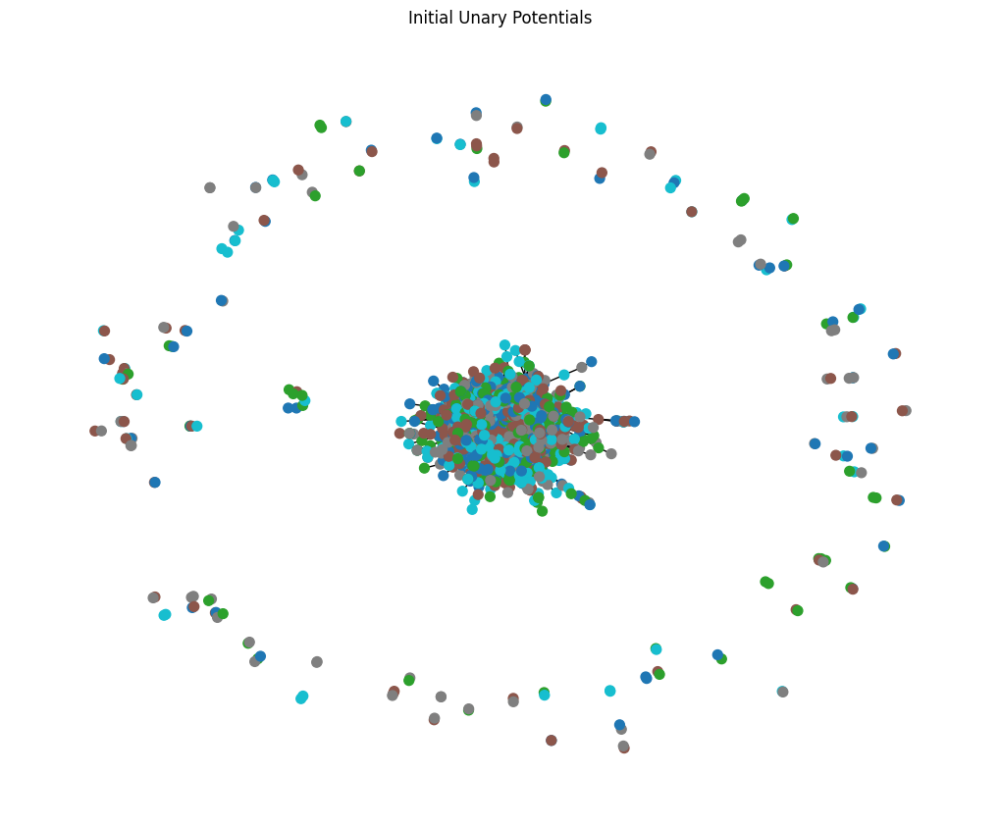

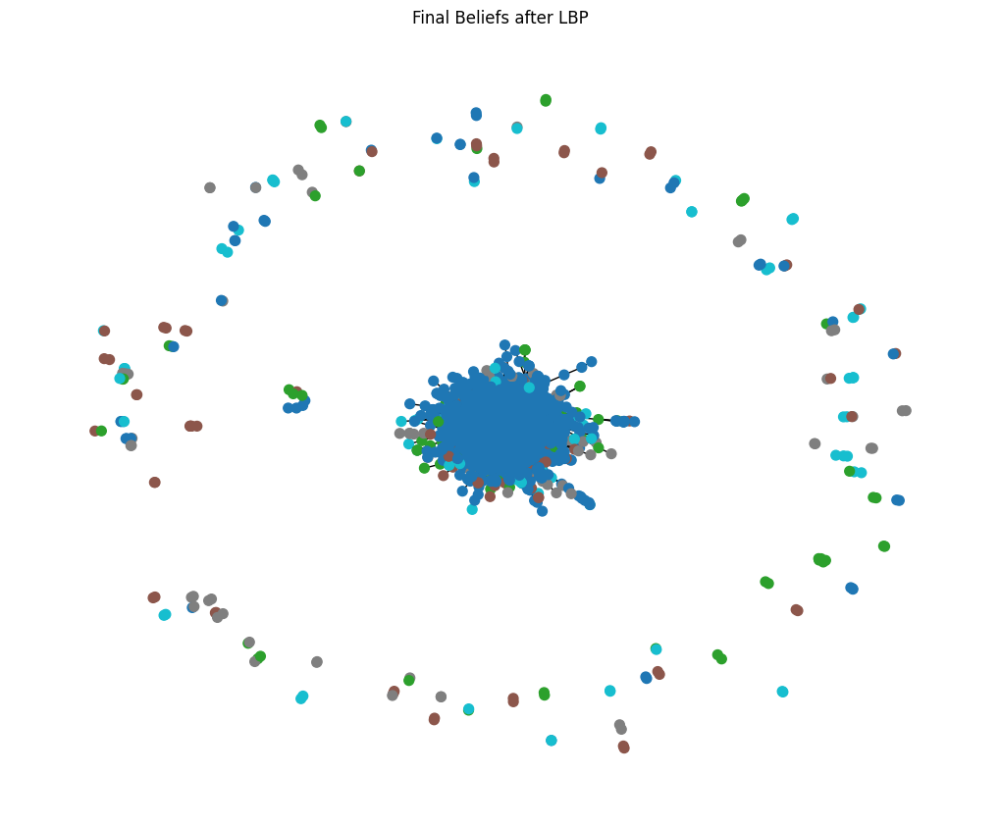

In [10]:
def visualize_graph(G, beliefs, title="PPI Graph with LBP"):
    # Assign colors based on max belief label
    node_colors = {node: np.argmax(belief) for node, belief in beliefs.items()}

    # Draw graph
    pos = nx.spring_layout(G, seed=42)
    color_map = [node_colors[node] for node in G.nodes]

    plt.figure(figsize=(10, 8))
    nx.draw(G, pos, node_color=color_map, cmap=plt.cm.tab10, with_labels=False, node_size=50)
    plt.title(title)
    plt.show()


# Visualize Initial and Final Beliefs for 5 lables
visualize_graph(G, unary_potential[3], title="Initial Unary Potentials")
visualize_graph(G, final_beliefs[5], title="Final Beliefs after LBP")


In [12]:
!pip3 install scikit-learn

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 11.1 MB 1.7 MB/s eta 0:00:01
     |████████████████████████████████| 301 kB 34.3 MB/s eta 0:00:01
You should consider upgrading via the '/Library/Developer/CommandLineTools/usr/bin/python3 -m pip install --upgrade pip' command.


In [14]:
from sklearn.metrics import f1_score

# Synthetic "true" labels (initial labels used as ground truth)
true_labels = {node: np.argmax(unary_potential[3][node]) for node in G.nodes}
pred_labels = {node: np.argmax(final_beliefs[5][node]) for node in G.nodes}

# Compute F1-score
true_labels_list = [true_labels[node] for node in G.nodes]
pred_labels_list = [pred_labels[node] for node in G.nodes]
f1 = f1_score(true_labels_list, pred_labels_list, average="macro")
print(f"F1 Score after LBP: {f1:.4f}")


F1 Score after LBP: 0.1108
